In [33]:
import glob
import plt

quic_files = glob.glob("quicly-*/*")
tcp_files = glob.glob("tcp-*/*")
vpn_files = glob.glob("vpn-*/*")


In [34]:
import json

#artificial_start should be set to the first timestamp from the client log,
#when analysing server files only

def get_pn_over_time(file, direction, artificial_start=None):
    q_s_points = []
    with open(file) as w:
        if not artificial_start:
            first = True
            for line in w:
                line = json.loads(line)
                if first:
                    first_time = line["time"]
                    first= False
                if line["type"]==direction:
                    q_s_points.append((line["pn"], line["time"] - first_time))
        else:
            for line in w:
                line = json.loads(line)
                if line["type"]==direction:
                    q_s_points.append((line["pn"], line["time"] - artificial_start))
    return q_s_points


In [35]:
def get_sn_over_time(file, direction, mss):
    tcp_points={}
    tcp_points["forward"] = []
    tcp_points["reverse"] = []
    first = True
    first_forward = True
    first_rev = True
    tr = plt.trace(file)
    tr.start()
    for pkt in tr:
        if pkt.tcp:
            if first:
                first_time = pkt.seconds*1000

                first = False
            if pkt.tcp.dst_port == 443:
                if first_forward:
                    forward_sn = pkt.tcp.seq_nbr
                    first_forward = False
                tcp_points["forward"].append(((pkt.tcp.seq_nbr - forward_sn)/mss, pkt.seconds*1000 - first_time))
            else:
                if first_rev:
                    rev_sn = pkt.tcp.seq_nbr
                    first_rev = False                
                tcp_points["reverse"].append(((pkt.tcp.seq_nbr - rev_sn)/mss, pkt.seconds*1000 - first_time))
    
    return tcp_points[direction]


In [36]:
import matplotlib.pyplot as mplt
from matplotlib.pyplot import figure
from matplotlib.dates import DateFormatter
from collections import defaultdict
import numpy as np
import datetime
from pylab import *
matplotlib.rcParams.update({'font.size': 15})

def mjrFormatter(x, pos):
    s, ms = divmod(x, 1000)
    return "{:01d}.{:01d}".format(int(s),int(ms))


In [ ]:
for file in quic_files:
    for direction in ["quictrace-recv", "quictrace-sent"]:
        a, b  = zip(*(get_pn_over_time(file, direction)))
        name = file.strip(".log")
        ax = mplt.subplot()
        ax.xaxis.set_major_formatter(mpl.ticker.FuncFormatter(mjrFormatter))
        mplt.title("QUIC, PN versus time, {} direction, seen from {}".format(direction, name))
        mplt.ylabel('Packet Number')
        mplt.xlabel('Time (seconds)')
        ax.set_xlim(0,10000)

        mplt.plot(b, a, 'go--', linewidth=0.0, markersize=1, color="black")
        mplt.show()


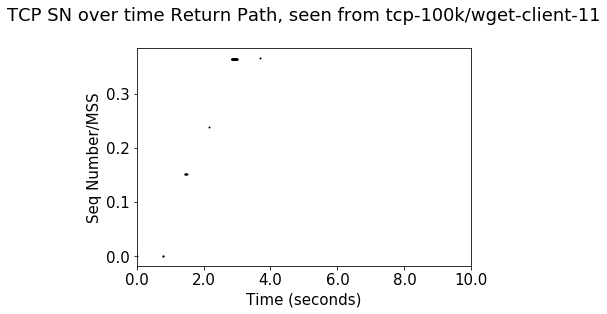

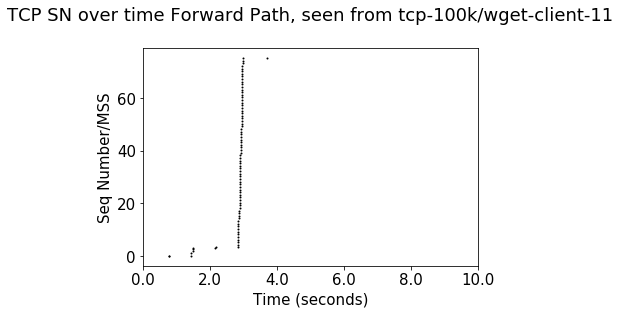

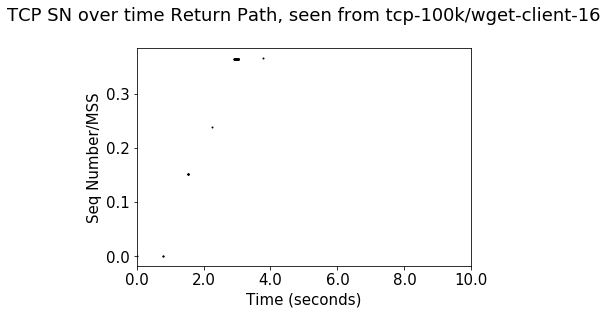

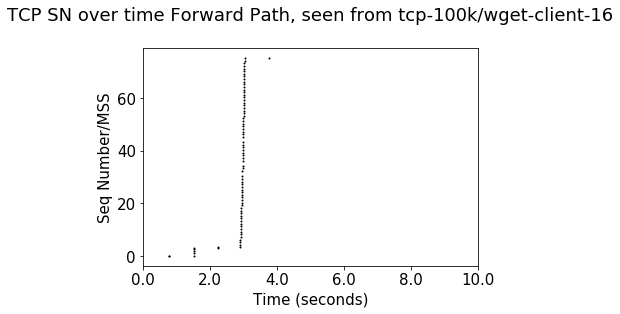

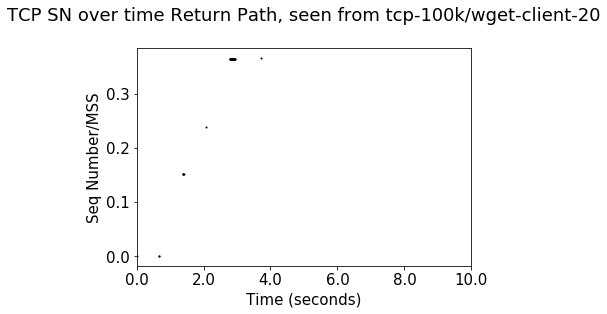

...

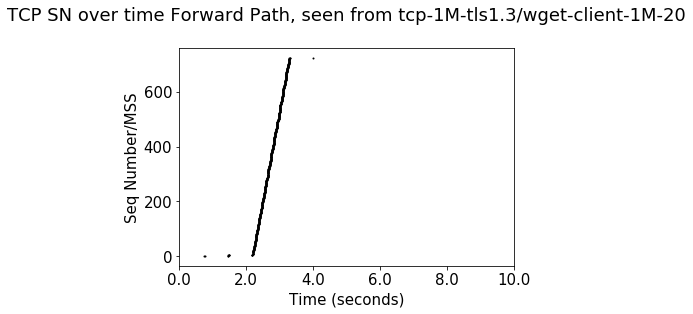

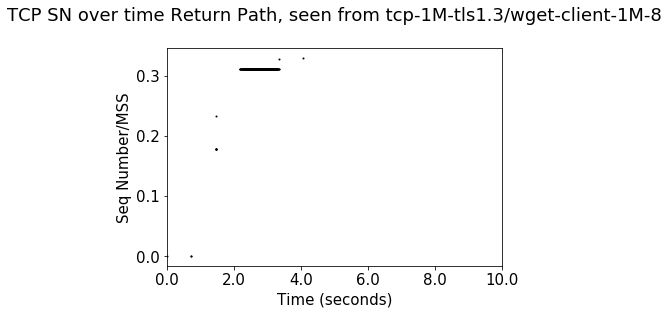

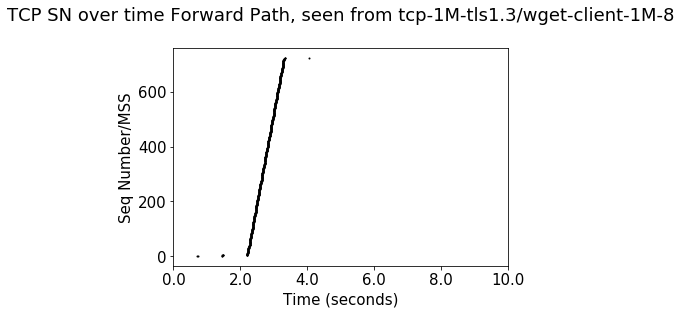

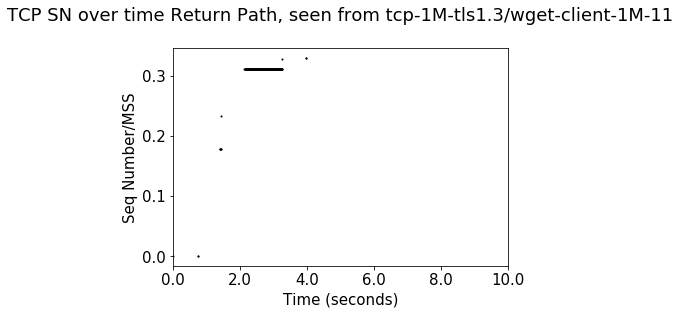

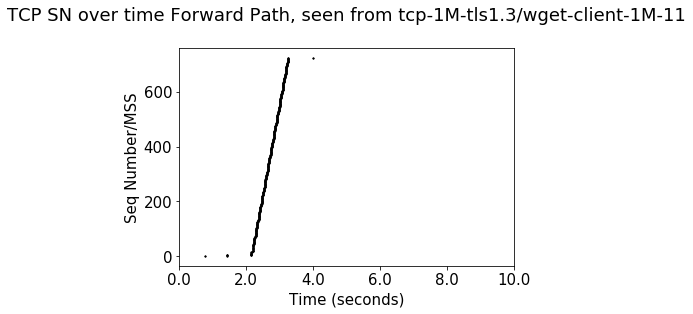

In [21]:
import plt
matplotlib.rcParams.update({'font.size': 15})

for file in tcp_files:
    for direction in ["forward", "reverse"]:
        a, b  = zip(*(get_sn_over_time(file, direction,1460)))
        if direction == "reverse":
            d = "Forward"
        else:
            d = "Return"

        name = file.strip(".pcap")
        ax = mplt.subplot()
        ax.xaxis.set_major_formatter(mpl.ticker.FuncFormatter(mjrFormatter))
        mplt.title("TCP SN over time {} Path, seen from {}".format(d, name), y=1.1)
        mplt.ylabel('Seq Number/MSS')
        mplt.xlabel('Time (seconds)')
        ax.set_xlim(0,10000)
        mplt.plot(b, a, 'go--', linewidth=0.0, markersize=1, color="black")
        mplt.show()


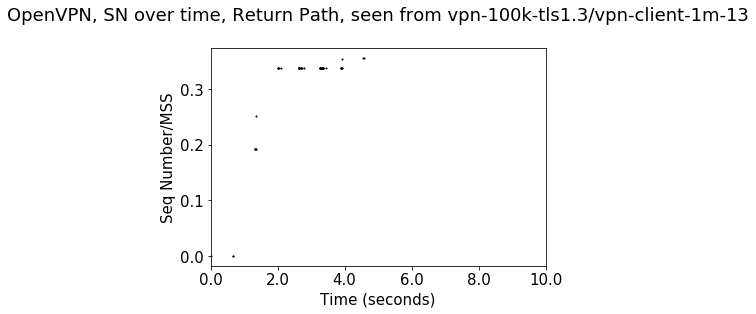

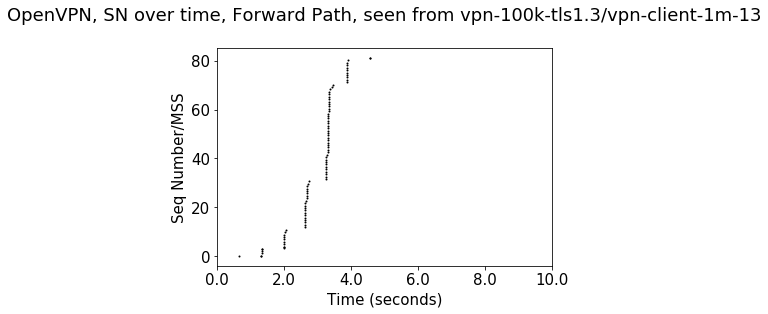

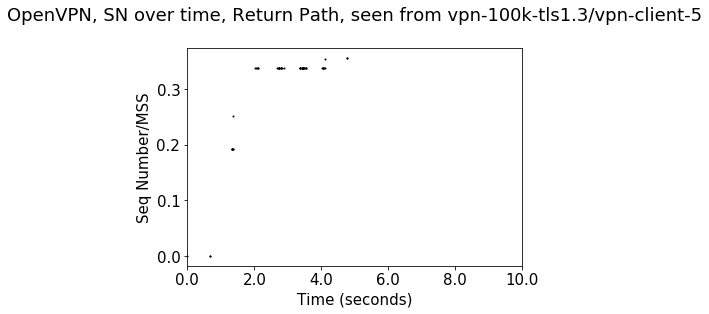

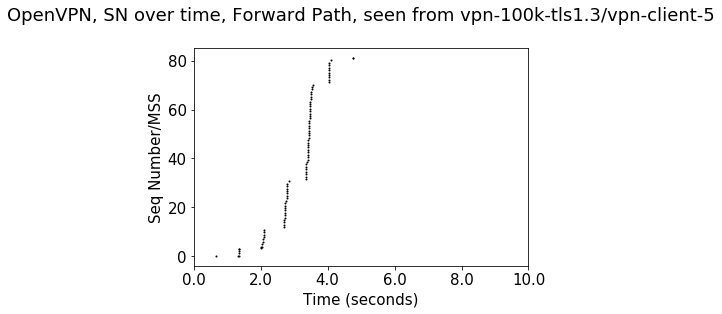

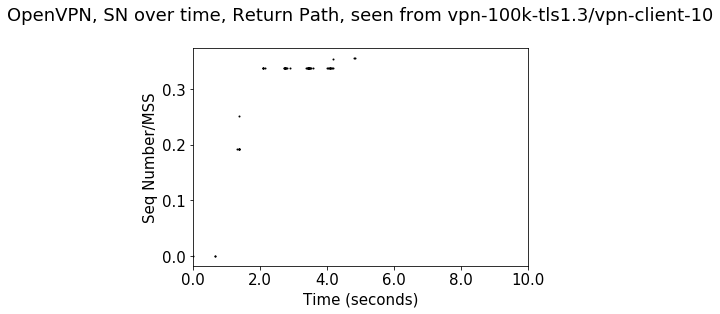

...

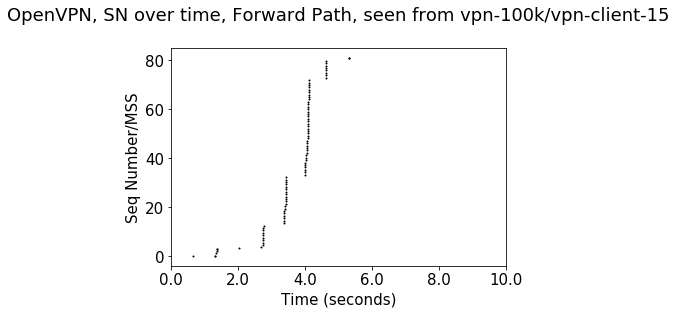

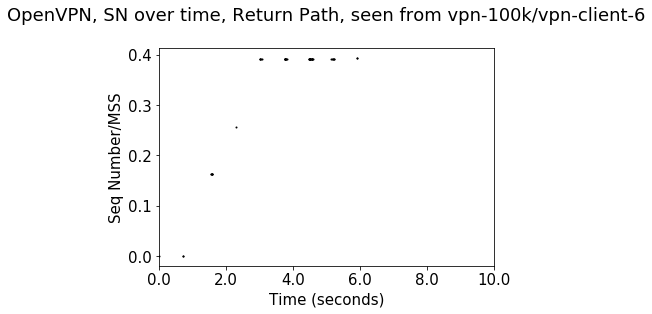

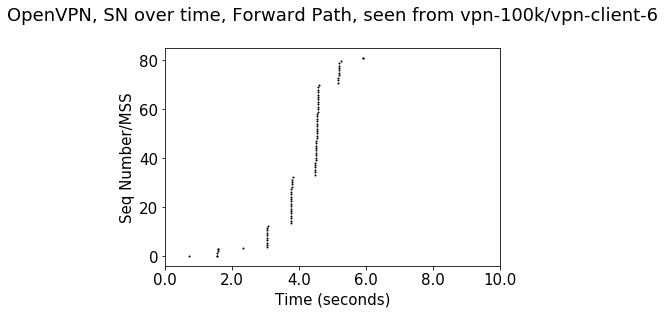

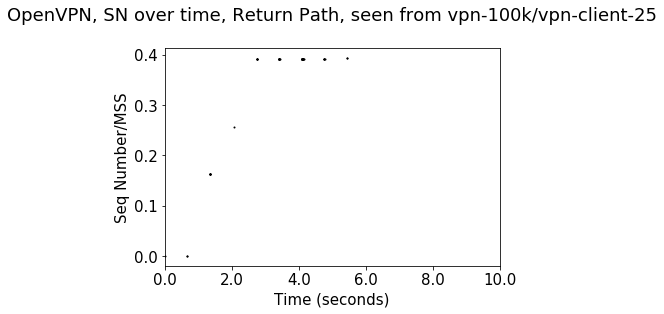

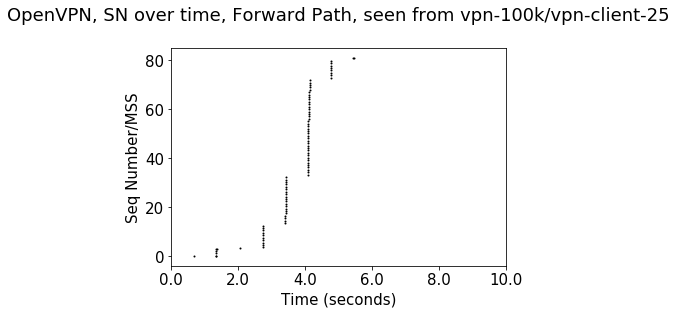

In [23]:
import plt
color = {}

for file in vpn_files:
    #print(get_sn_over_time(file, "forward"))
    #break
    for direction in ["forward", "reverse"]:
        a, b  = zip(*(get_sn_over_time(file, direction,1358)))
        if direction != "forward":
            d = "Forward"
        else:
            d = "Return"
        name = file.strip(".pcap")
        ax = mplt.subplot()
        ax.xaxis.set_major_formatter(mpl.ticker.FuncFormatter(mjrFormatter))
        mplt.title("OpenVPN, SN over time, {} Path, seen from {}".format(d, name), y=1.1)
        mplt.ylabel('Seq Number/MSS')
        mplt.xlabel('Time (seconds)')
        ax.set_xlim(0,10000)

        mplt.plot(b, a, 'go--', linewidth=0.0, markersize=1, color="black")
        mplt.show()

